In [2]:
import snapatac2 as snap
import numpy as np
import os
import scanpy as sc
import pandas as pd
snap.__version__


'2.8.0'

In [ ]:
# files = [
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC25A_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC37A_AMY/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC39C_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC48D_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC50B_AMY/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC50B_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC50B_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC52E_AMY/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MC52E_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW26A_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW45A_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW47A_AMY/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW47A_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW47A_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW51A_AMY/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW51A_HIP/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW51A_PFC/',
# '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW65A_AMY/'
# ]


In [ ]:
# files = [ os.path.join(fl,"outs","fragments.tsv.gz") for fl in files]

In [1]:
import glob
csds_files = glob.glob('/data1st1/CSDS_atac/data/fragments/*/*fragments.tsv.gz')

In [ ]:
# %%time
# data = snap.pp.import_fragments(
#     '/data1st2/hannan_25/data/snATAC_process/snATAC_01_bam/MW65A-AMY/outs/fragments.tsv.gz',
#     chrom_sizes=snap.genome.mm10,
#     file="/data2st1/junyi/output/atac0627/MW65A_AMY.h5ad",  # Optional
#     sorted_by_barcode=False,
# )


In [3]:
%%time
# fragment_file = "/data2st1/junyi/WT_W26/outs/fragments.tsv.gz"
# chromzie_file = "/data2st1/junyi/ref/mm10.chrom.sizes"

# # Load the fragment file
data = snap.pp.import_fragments(
    csds_files,
    file = [  "/data2st1/junyi/output/ataccsds1223/"+fl.split("/")[-2]+".h5ad" for fl in csds_files]
    , chrom_sizes=snap.genome.mm10, 
    min_num_fragments=1000,
    sorted_by_barcode=False)


100%|██████████| 2/2 [02:48<00:00, 84.20s/it] 


CPU times: user 47.4 ms, sys: 295 ms, total: 342 ms
Wall time: 2min 49s


In [ ]:
# adatas= data

In [ ]:
# adatas

In [4]:
%%time
snap.metrics.tsse(data, snap.genome.mm10)


100%|██████████| 2/2 [00:09<00:00,  4.94s/it]


CPU times: user 41.3 ms, sys: 25.1 ms, total: 66.4 ms
Wall time: 10.3 s


/data2st1/junyi/output/ataccsds1223/YS25110560_sus_HIP_arc.h5ad


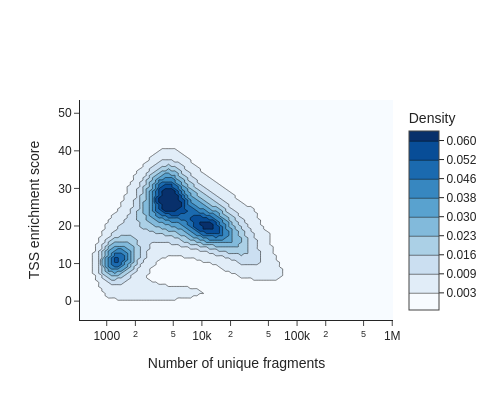

/data2st1/junyi/output/ataccsds1223/YS25110560_tms_HIP_arc.h5ad


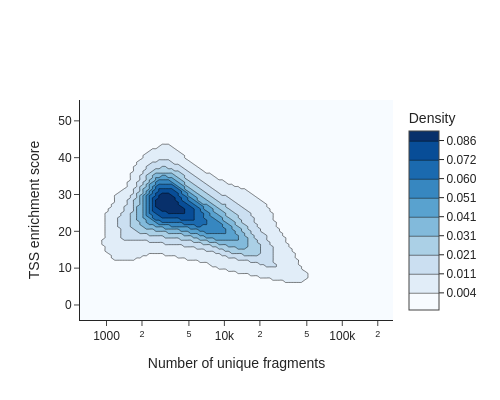

In [5]:
for data_tmp in data:
    fig = snap.pl.tsse(data_tmp, interactive=False)
    print(data_tmp.filename)
    display(fig)
    # figures.append(fig)
    # names.append(data.filename.split("/")[-1].split(".")[0])

In [ ]:
# display(fig)

In [ ]:
# from PIL import Image
# figures  = []
# names = []
# for data in adatas:
#     fig = snap.pl.tsse(data, interactive=False)
#     print(data.filename)
#     display(fig)
#     # figures.append(fig)
#     # names.append(data.filename.split("/")[-1].split(".")[0])

In [6]:
snap.pp.filter_cells(data, min_counts=3000, min_tsse=3, max_counts=100000)
snap.pp.add_tile_matrix(data, bin_size=5000)
snap.pp.select_features(data, n_features=50000)
snap.pp.scrublet(data)
#snap.pp.filter_doublets(data)
data.close()

100%|██████████| 2/2 [00:38<00:00, 19.36s/it]


AttributeError: 'list' object has no attribute 'close'

In [7]:
for dtemp in data:
    dtemp.close()

In [ ]:
# data = snap.AnnDataSet(
#     adatas=[(name, adata) for (name), adata in zip(files, adatas)],
#     filename="output/atac0416/mouse_brain.h5ads"
# )

In [ ]:
# print(f'Number of cells: {data.n_obs}')
# print(f'Number of unique barcodes: {np.unique(data.obs_names).size}')


In [ ]:
# data.var

In [ ]:
# unique_cell_ids = [sa + ':' + bc for sa, bc in zip(data.obs['sample'], data.obs_names)]
# data.obs_names = unique_cell_ids
# assert data.n_obs == np.unique(data.obs_names).size


In [ ]:
# snap.pp.select_features(data, n_features=50000)


In [8]:
adfiles={
# 'MC37A_AMY':'/data2st1/junyi/output/atac0627/MC37A_AMY.h5ad',
'MC39C_HIP':'/data2st1/junyi/output/atac0627/MC39C_HIP.h5ad',
'MC48D_HIP':'/data2st1/junyi/output/atac0627/MC48D_HIP.h5ad',
# 'MC50B_AMY':'/data2st1/junyi/output/atac0627/MC50B_AMY.h5ad',
'MC50B_HIP':'/data2st1/junyi/output/atac0627/MC50B_HIP.h5ad',
# 'MC50B_PFC':'/data2st1/junyi/output/atac0627/MC50B_PFC.h5ad',
# 'MC52E_AMY':'/data2st1/junyi/output/atac0627/MC52E_AMY.h5ad',
# 'MC52E_PFC':'/data2st1/junyi/output/atac0627/MC52E_PFC.h5ad',
'MW45A_HIP':'/data2st1/junyi/output/atac0627/MW45A_HIP.h5ad',
# 'MW47A_AMY':'/data2st1/junyi/output/atac0627/MW47A_AMY.h5ad',
'MW47A_HIP':'/data2st1/junyi/output/atac0627/MW47A_HIP.h5ad',
# 'MW47A_PFC':'/data2st1/junyi/output/atac0627/MW47A_PFC.h5ad',
# 'MW51A_AMY':'/data2st1/junyi/output/atac0627/MW51A_AMY.h5ad',
'MW51A_HIP':'/data2st1/junyi/output/atac0627/MW51A_HIP.h5ad',
# 'MW51A_PFC':'/data2st1/junyi/output/atac0627/MW51A_PFC.h5ad',
# 'MC25A_PFC':'/data2st1/junyi/output/atac0627/MC25A_PFC.h5ad',
# 'MW26A_PFC':'/data2st1/junyi/output/atac0627/MW26A_PFC.h5ad',
# # 'MW65A_AMY':'/data2st1/junyi/output/atac0627/MW65A_AMY.h5ad',
'CS01A_HIP':'/data2st1/junyi/output/ataccsds1223/YS25110560_sus_HIP_arc.h5ad',
'RT01A_HIP':'/data2st1/junyi/output/ataccsds1223/YS25110560_tms_HIP_arc.h5ad'
# 'MC25A_PFC':'/data2st1/junyi/output/atac0416/W25_0_1_Perfrontal.h5ad',
# 'MW26A_PFC':'/data2st1/junyi/output/atac0416/W26_0_2_Perfrontal.h5ad'
}

# newfolder = "/data2st1/junyi/output/atac0627/"


In [9]:

# # for each file ind adfiles, make a hard link to the file in newfolder
# for name, adfile in adfiles.items():
#     newfile = os.path.join(newfolder, name + ".h5ad")
#     if not os.path.exists(newfile):
#         os.link(adfile, newfile)
#         print(f"Created hard link for {name} at {newfile}")
#     else:
#         print(f"File {newfile} already exists, skipping.")
# for name, adfile in adfiles.items():
#     data = snap.read(adfile)
#     snap.pp.scrublet(data)
#     data.close()

adatass = [ snap.read(k) for k in adfiles.values()]


In [11]:
adatass[1].var_names

['chr1:0-5000',
 'chr1:5000-10000',
 'chr1:10000-15000',
 'chr1:15000-20000',
 'chr1:20000-25000',
 'chr1:25000-30000',
 'chr1:30000-35000',
 'chr1:35000-40000',
 'chr1:40000-45000',
 'chr1:45000-50000',
 'chr1:50000-55000',
 'chr1:55000-60000',
 'chr1:60000-65000',
 'chr1:65000-70000',
 'chr1:70000-75000',
 'chr1:75000-80000',
 'chr1:80000-85000',
 'chr1:85000-90000',
 'chr1:90000-95000',
 'chr1:95000-100000',
 'chr1:100000-105000',
 'chr1:105000-110000',
 'chr1:110000-115000',
 'chr1:115000-120000',
 'chr1:120000-125000',
 'chr1:125000-130000',
 'chr1:130000-135000',
 'chr1:135000-140000',
 'chr1:140000-145000',
 'chr1:145000-150000',
 'chr1:150000-155000',
 'chr1:155000-160000',
 'chr1:160000-165000',
 'chr1:165000-170000',
 'chr1:170000-175000',
 'chr1:175000-180000',
 'chr1:180000-185000',
 'chr1:185000-190000',
 'chr1:190000-195000',
 'chr1:195000-200000',
 'chr1:200000-205000',
 'chr1:205000-210000',
 'chr1:210000-215000',
 'chr1:215000-220000',
 'chr1:220000-225000',
 'chr1:225

In [12]:

data = snap.AnnDataSet(
    adatas=[(name, adata) for (name), adata in zip(adfiles.keys(), adatass)],
    filename="/data2st1/junyi/output/ataccsds1223/HIP_csds.h5ads"
)

In [13]:
print(f'Number of cells: {data.n_obs}')
print(f'Number of unique barcodes: {np.unique(data.obs_names).size}')


Number of cells: 72463
Number of unique barcodes: 70498


In [14]:
unique_cell_ids = [sa + ':' + bc for sa, bc in zip(data.obs['sample'], data.obs_names)]
data.obs_names = unique_cell_ids
assert data.n_obs == np.unique(data.obs_names).size


/tmp/ipykernel_3247373/236184181.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [15]:
data.obs["doublet_probability"] = data.adatas.obs["doublet_probability"]
data.obs['doublet_score'] = data.adatas.obs["doublet_score"]


/tmp/ipykernel_3247373/3327562311.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/3327562311.py:2: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [16]:
print(sum(data.obs['doublet_probability']>0.5), "doublets found in the dataset")

4410 doublets found in the dataset


/tmp/ipykernel_3247373/1726121646.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [17]:
data

AnnDataSet object with n_obs x n_vars = 72463 x 526765 backed at '/data2st1/junyi/output/ataccsds1223/HIP_csds.h5ads'
contains 8 AnnData objects with keys: 'MC39C_HIP', 'MC48D_HIP', 'MC50B_HIP', 'MW45A_HIP', 'MW47A_HIP', 'MW51A_HIP', 'CS01A_HIP', 'RT01A_HIP'
    obs: 'sample', 'doublet_probability', 'doublet_score'
    uns: 'reference_sequences', 'AnnDataSet'

In [18]:
%%time
snap.pp.select_features(data, n_features=50000)
snap.tl.spectral(data)
snap.tl.umap(data)

2025-12-24 10:45:36 - INFO - Selected 50000 features.
/home/junyichen/anaconda3/envs/snapatac2/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/junyichen/anaconda3/envs/snapatac2/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



CPU times: user 7min 42s, sys: 1min 24s, total: 9min 7s
Wall time: 5min 38s


In [24]:
data.obs['sample']

/tmp/ipykernel_3247373/3234928271.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



sample
str
"""MC39C_HIP"""
"""MC39C_HIP"""
"""MC39C_HIP"""
"""MC39C_HIP"""
"""MC39C_HIP"""
…
"""RT01A_HIP"""
"""RT01A_HIP"""
"""RT01A_HIP"""


In [38]:
adata = data.to_adata()

/tmp/ipykernel_3247373/4224175226.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/4224175226.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/4224175226.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/4224175226.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [41]:
sc.pp.calculate_qc_metrics(adata, inplace=True)

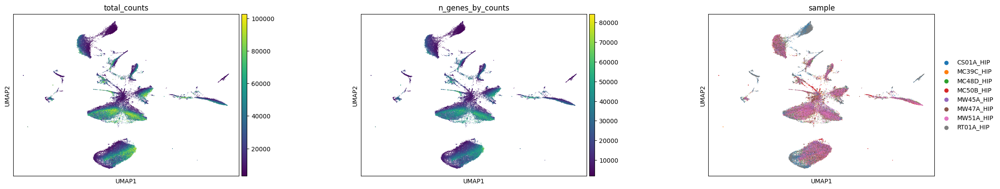

In [44]:
sc.pl.umap(adata, color=['total_counts', 'n_genes_by_counts','sample'], wspace=0.4)

In [ ]:
sc.pl.

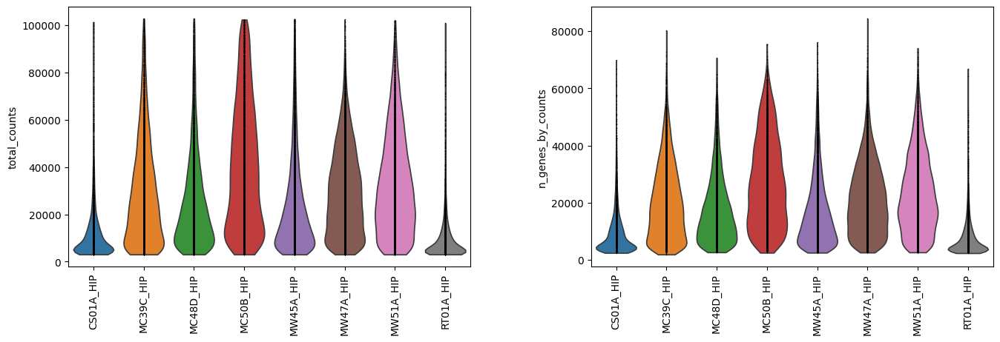

In [48]:
sc.pl.violin(adata, ['total_counts', 'n_genes_by_counts'],jitter=False, groupby='sample', rotation=90)

In [20]:
idx = data.obs_names

In [21]:
dp = data.obs['doublet_probability']

/tmp/ipykernel_3247373/2321195013.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [22]:
sp = data.obs['sample']

/tmp/ipykernel_3247373/3821999149.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [ ]:
data = snap.read_dataset("/data2st1/junyi/output/atac0627/mouse_brain_subset.h5ads")

In [49]:
df_spdf = pd.DataFrame({
    'barcode': idx,
    'sample':sp,
    'doublet_probability': dp})

In [50]:
df_spdf['is_doublet'] = df_spdf['doublet_probability'] > 0.5

In [51]:
df_spdf.groupby('sample').sum()['is_doublet']

/tmp/ipykernel_3247373/3504341530.py:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



sample
CS01A_HIP    636
MC39C_HIP    528
MC48D_HIP    452
MC50B_HIP    184
MW45A_HIP    735
MW47A_HIP    866
MW51A_HIP    352
RT01A_HIP    657
Name: is_doublet, dtype: int64

In [52]:
index = df_spdf[df_spdf['doublet_probability']<0.5].barcode.values


In [ ]:
data.close()

In [ ]:
datasubset,newidx =data.subset(obs_indices=index,out=f'/data2st1/junyi/output/atac0627/doublet_filtered.h5ads')


In [ ]:
snap.pl.umap(datasubset,color='doublet_probability',marker_size=2)  # 6，9，10，11

In [ ]:
%%time
snap.pp.select_features(datasubset, n_features=50000)
snap.tl.spectral(datasubset)


In [ ]:
snap.tl.umap(datasubset)

snap.pl.umap(datasubset,color='doublet_probability',marker_size=2)  # 6，9，10，11

In [67]:
snap.pp.knn(datasubset, use_rep="X_spectral")


In [68]:
snap.tl.leiden(datasubset)


In [ ]:
snap.pl.umap(datasubset,color='leiden',marker_size=2)  # 6，9，10，11

In [70]:
datasubset.obs['leiden_default'] = datasubset.obs['leiden']

/tmp/ipykernel_3247373/3869616494.py:1: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



In [71]:
from sklearn.metrics import silhouette_score
X=datasubset.obsm['X_spectral']
max_silhoutte = -1

for res in np.arange(0.1, 2.0, 0.1):
    snap.tl.leiden(datasubset, resolution=res)

    # round the res to 2 decimal places
    res_name = round(res, 2)
    datasubset.obs['leiden_res_'+str(res_name)] = datasubset.obs['leiden']
    Y=datasubset.obs['leiden']

    # Calculate silhouette score
    try:
        score = silhouette_score(X,Y)
    except ValueError as e:
        score = 0
    if score > max_silhoutte:
        max_silhoutte = score
        best_res = res
        print(f"Best silhouette score: {max_silhoutte} at resolution {best_res}")


/tmp/ipykernel_3247373/2594991226.py:10: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/2594991226.py:11: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'



Best silhouette score: 0.21581630474591024 at resolution 0.1


/tmp/ipykernel_3247373/2594991226.py:10: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/2594991226.py:11: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/2594991226.py:10: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/2594991226.py:11: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 'pyo3-polars'

/tmp/ipykernel_3247373/2594991226.py:10: DeprecationWarning:

`Series._import_from_c` is deprecated. use _import_arrow_from_c; if you are using an extension, please compile it with latest 

In [ ]:
datasubset

In [ ]:
snap.pl.umap(datasubset,color='leiden_res_0.5',marker_size=2)  # 6，9，10，11

In [53]:
datasubset = data

In [54]:
query = snap.pp.make_gene_matrix(datasubset, gene_anno=snap.genome.mm10)


/home/junyichen/anaconda3/envs/snapatac2/lib/python3.10/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning:

Transforming to str index.



In [ ]:
datasubset.close()

In [55]:
query.obsm['X_spectral_tile']=datasubset.obsm['X_spectral']
query.obsm['X_umap_tile']=datasubset.obsm['X_umap']

In [56]:
query.obsm

AxisArrays with keys: X_spectral_tile, X_umap_tile

In [57]:
query.write_h5ad('/data2st1/junyi/output/ataccsds1223/CSDS_gene.h5ad')

... storing 'sample' as categorical


In [58]:
query.layers['count'] = query.X.copy()

In [59]:
sc.pp.normalize_total(query, target_sum=1e4)
sc.pp.log1p(query)
sc.pp.scale(query)

In [60]:
# for all columns in query.obs, if the column name starts with 'leiden', and the name is too long, just keep the first 2 digit after leiden_res_xx
rename_map = {}
for col in query.obs.columns:
    if col.startswith('leiden_res_'):
        rename_map[col] = col[:14]

In [61]:
query.obs.rename(columns=rename_map, inplace=True)

In [63]:
query

AnnData object with n_obs × n_vars = 72463 × 55291
    obs: 'sample', 'doublet_probability', 'doublet_score'
    var: 'mean', 'std'
    uns: 'log1p'
    obsm: 'X_spectral_tile', 'X_umap_tile'
    layers: 'count'

In [64]:
snap.pl.umap(query,color='doublet_score',use_rep='X_umap_tile')

In [65]:
marker_genes_dict = {
    "Neuron": ["Snap25", "Syt1", "Gad1", "Slc17a7"],
    "Astrocyte-Epen": ["Gfap", "Aqp4", "Slc1a3", "Aldh1l1"],
    "OPC-Oligo": ["Mag", "Mog", "Pdgfra", "Plp1"],
    "Vascular": ["Flt1", "Kcnj8", "Dcn"],
    "Immune": ["Cx3cr1", "Dock8"]
}
sc.pl.dotplot(query, marker_genes_dict, "leiden_res_"+str(1.9), dendrogram=False)


ValueError: groupby has to be a valid observation. Given leiden_res_1.9, is not in observations: ['sample', 'doublet_probability', 'doublet_score']

In [ ]:
query.obsm['X_umap'] = query.obsm['X_umap_tile']

In [ ]:
sc.pl.umap(query,color=marker_genes_dict['Neuron'])

In [ ]:
sc.pl.umap(query,color=marker_genes_dict['OPC-Oligo'])

In [ ]:
sc.pl.umap(query,color=marker_genes_dict['Astrocyte-Epen'])

In [ ]:
sc.pl.umap(query,color=marker_genes_dict['Vascular'],ncols=1,size=1)

In [ ]:
sc.pl.umap(query,color=marker_genes_dict['Immune'],ncols=1,size=1)

In [ ]:
# query.obs.to_csv('/data2st1/junyi/output/atac0416/3REGIONS_meta_refined.csv')

In [ ]:
# query.write_h5ad('/data2st1/junyi/output/atac0416/3REGIONS_gene.h5ad')

In [ ]:
sc.pl.dotplot(query, marker_genes_dict, "leiden_res_"+str(0.5), dendrogram=False)


In [ ]:
# snap.pl.umap(query,color='celltype.L1',size=10)

In [ ]:
snap.pl.umap(query,color='leiden_res_'+str(best_res),marker_size=2)  # 6，9，10，11

In [ ]:
# query.obs['celltype.L1.old'] = query.obs['celltype.L1']

In [ ]:
# query.obs['celltype.L1'] = 'Neuron'
# query.obs.loc[query.obs.leiden=='10','celltype.L1'] =  'Astro-Epen'
# query.obs.loc[query.obs.leiden=='11','celltype.L1'] =  'OPC-Oligo'
# query.obs.loc[query.obs.leiden=='6','celltype.L1'] =  'OPC-Oligo'
# query.obs.loc[query.obs.leiden=='9','celltype.L1'] =  'Immune'


query.obs['celltype.L1'] = 'Neuron'
query.obs.loc[query.obs['leiden_res_0.5']=='8','celltype.L1'] =  'Astro-Epen'
query.obs.loc[query.obs['leiden_res_0.5']=='10','celltype.L1'] =  'OPC-Oligo'
query.obs.loc[query.obs['leiden_res_0.5']=='6','celltype.L1'] =  'OPC-Oligo'
query.obs.loc[query.obs['leiden_res_0.5']=='7','celltype.L1'] =  'Immune'
query.obs.loc[query.obs['leiden_res_1.9']=='21','celltype.L1'] =  'Vascular'


In [ ]:
sc.pl.umap(query,color='celltype.L1',ncols=1,size=10)

In [ ]:
query.write_h5ad('/data2st1/junyi/output/atac0627/3REGIONS_gene.h5ad')

In [ ]:
query.obs['Region'] = query.obs['sample'].str.split("_").str[1]


In [ ]:
query.obs['Condition']=query.obs['sample'].str[:2]

In [ ]:
sc.pl.umap(query,color='Region',ncols=1,size=10)

In [ ]:
for region in query.obs['Region'].unique():
    adata_region = query[query.obs['Region'] == region]
    adata_neuron = adata_region[adata_region.obs['celltype.L1'] == 'Neuron']
    adata_neuron.write_h5ad(f'/data2st1/junyi/output/atac0627/3REGIONS_gene_{region}_Neuron.h5ad')

    adata_nn = adata_region[~(adata_region.obs['celltype.L1'] == 'Neuron')]
    adata_nn.write_h5ad(f'/data2st1/junyi/output/atac0627/3REGIONS_gene_{region}_NN.h5ad')